# Genesis Potential Index (GPI)
* Wenchang Yang (wenchang@princeton.edu)
* Department of Geoscience, Princeton University

In [1]:
%run -im pythonstartup

**2019-05-20T15:17:23.360906**
>>> Importing Python 3.7.3 packages...
[OK]: import sys, os, os.path, datetime, glob
[OK]: import numpy as np-1.16.3
[OK]: import matplotlib as mpl-3.0.3; backend: module://ipykernel.pylab.backend_inline
[OK]: #---import matplotlib.pyplot as plt
[OK]: #---from pylab import *
[OK]: import xarray as xr-0.12.1
[OK]: #---import netCDF4
[OK]: #---import dask
[OK]: #---import bottleneck
[OK]: import pandas as pd-0.24.2
[OK]: from mpl_toolkits.basemap import Basemap
      PROJ_LIB = /scratch/gpfs/GEOCLIM/wenchang/miniconda3/envs/geoclim/share/proj
>>>Import packages from Wenchang Yang (wython)...
[OK]: import geoplots as gt
[OK]: from geoplots import geoplot, fxyplot, mapplot, xticksyear
[OK]: import geoxarray
[OK]: import filter
[OK]: import xlearn
[OK]: import mysignal as sig
**Done**


In [2]:
# from lib.util import year_shift
# import xlearn
from mystats import p2t

%matplotlib notebook

In [2]:
nino_ens = [1, 3, 4, 7, 9, 12, 17, 22, 26, 29]
nina_ens = [2, 5, 6, 8, 10, 11, 16, 23, 27, 30]
neut_ens = [13, 14, 15, 18, 19, 20, 21, 24, 25, 28]

In [11]:
def axscale(ax=None, right=0, left=0, up=0, down=0):
    '''scale the axes by the four sides'''
    if ax is None:
        ax = plt.gca()
    x0, y0, w, h = ax.get_position().bounds
    w_new = w*(1 + right + left)
    h_new = h*(1 + up + down)
    x0_new = x0 - w*left
    y0_new = y0 - h*down
    ax.set_position([x0_new, y0_new, w_new, h_new])
    return ax

In [3]:
if 'das' in globals() or 'das' in locals():
    pass
else:
    das = dict()

## GPI

### data

In [6]:
# data
datanames = ['GPI',]# 'eta', 'H', 'Vpot', 'Vshear']
volcs = ['Pinatubo', 'Agung', 'StMaria']
years = [1991, 1963, 1902]
months = [6, 3, 10]
n_years = 3

for dataname in datanames:
    # volc
    ifiles = [f'data/{volc}_PI_ens_noleap.GPI.{dataname}.nc'
             for volc in volcs]
    for volc, ifile, yyyy, mm in zip(volcs, ifiles, years, months):
        key = f'{dataname}_{volc}'
        print(key, end='; ')
        da = xr.open_dataset(ifile)[dataname]
        das[key] = da

    # ctl
    ifile = f'data/CTL1860_noleap_tigercpu_intelmpi_18_576PE.GPI.{dataname}.nc'
    key = f'{dataname}_ctl'
    print(key, end='; ')
    da = xr.open_dataset(ifile)[dataname]
    das[key] = da


GPI_Pinatubo; GPI_Agung; GPI_StMaria; GPI_ctl; 

### fig

<IPython.core.display.Javascript object>


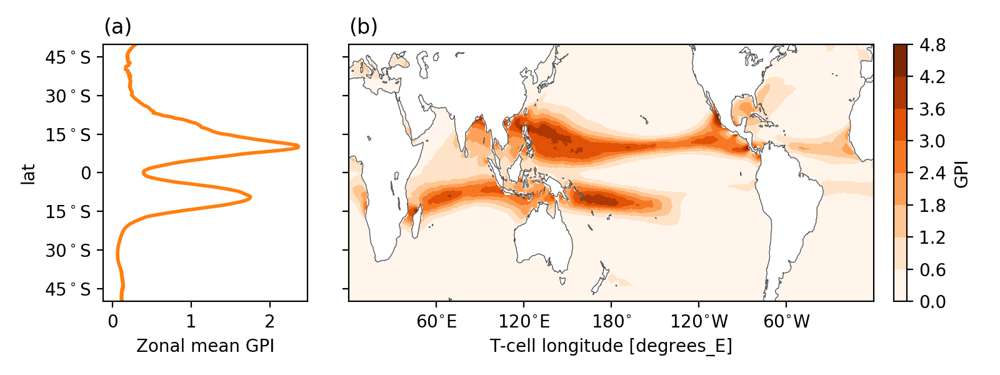

In [44]:
# GPI in control run
fig, axes = plt.subplots(1, 2, figsize=(8,3), sharey=True)
dataname = 'GPI'
ctl_ens = das[f'{dataname}_ctl']
da = ctl_ens
levels = 10#2**np.arange(-2, 7).astype('float')
cbar_kws = {}#dict(ticks=[0.25, 1, 4, 16, 64], format='%.2g')

ax = axes[0]
da.sel(time='0001').mean(['time', 'en', 'lon']).plot(ax=ax, y='lat', color='C1')
plt.autoscale()
ax.set_ylabel('lat')
ax.set_xlabel('Zonal mean GPI')
ax.set_title('(a)', loc='left')

ax = axes[1]

da.sel(time='0001').mean(['time', 'en']).rename('GPI') \
    .plot.contourf(ax=ax, robust=False, levels=levels, cbar_kwargs=cbar_kws, cmap='Oranges')
mapplot(coastlines_width=1/2)
plt.ylim(-50, 50)
plt.ylabel('')
ax.set_yticks(range(-45, 46, 15))
ax.set_yticklabels([f'{-n}$^\circ$S' for n in range(-45,0,15)]
                  + ['0']
                  + [f'{n}$^\circ$S' for n in range(15, 46, 15)])
ax.set_title('(b)', loc='left')



plt.tight_layout()
axscale(axes[0], right=-0.5)
axscale(axes[1], left=0.6)

plt.savefig('figs/fig_GPI_ctl.pdf')

<IPython.core.display.Javascript object>


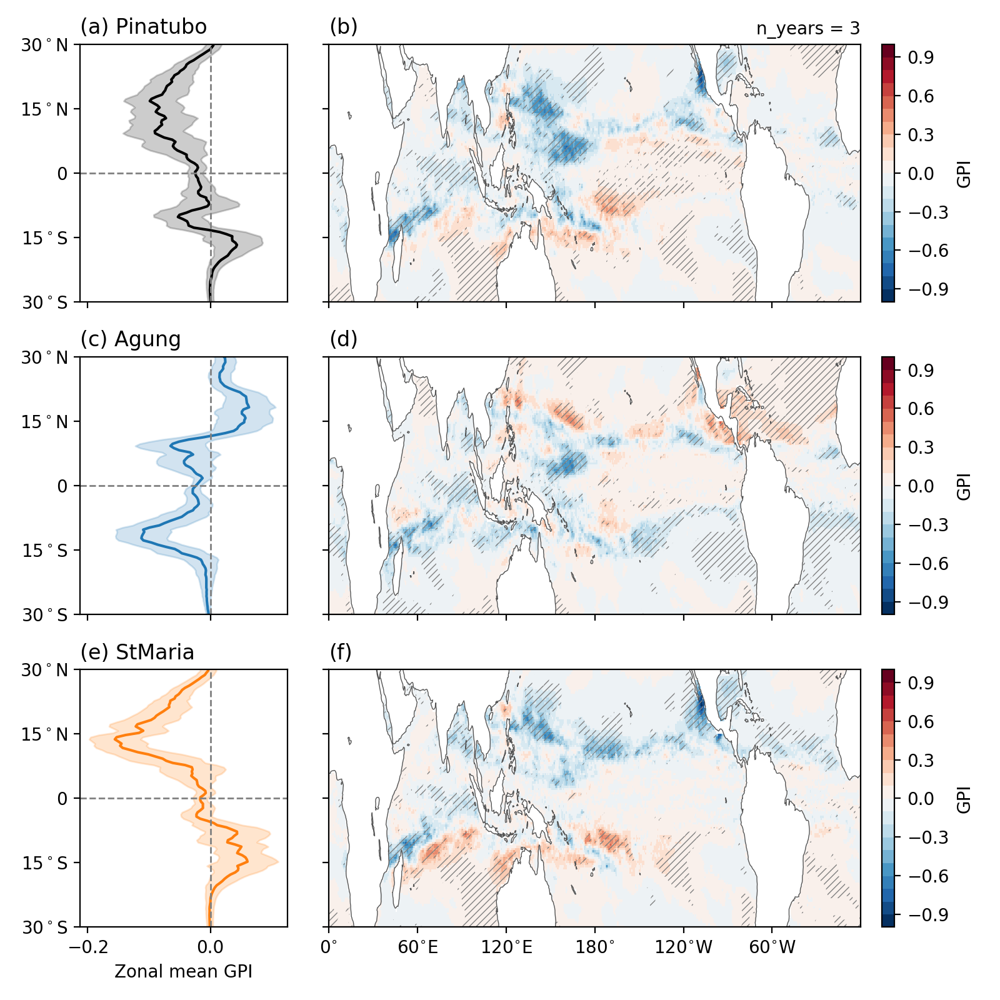

In [109]:
# fig  n_years = 3
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'GPI'
ctl_ens = das[f'{dataname}_ctl']
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = das[f'{dataname}_{volc}']
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-1,1.01,0.1) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean {dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


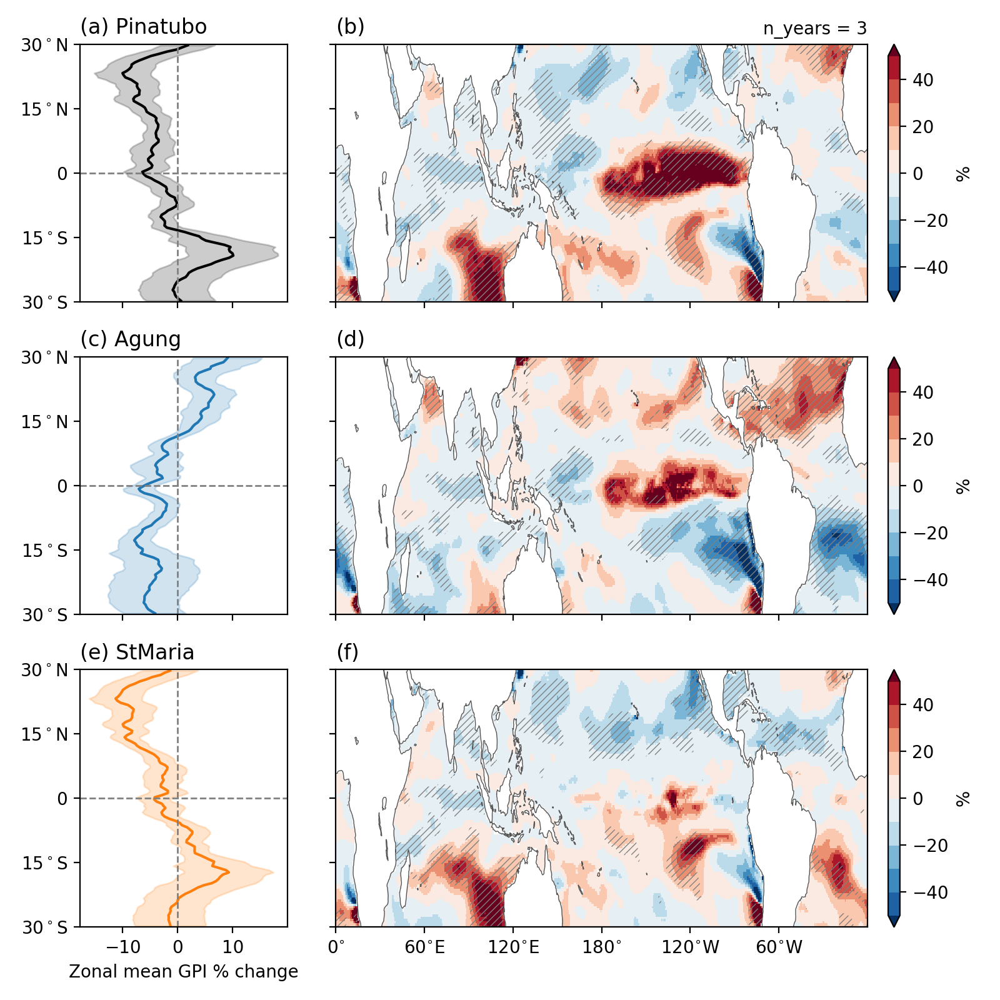

In [123]:
# fig  n_years = 3, smoothed percentage
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'GPI'
lat_slice = slice(-30,30)
ctl_ens = das[f'{dataname}_ctl'].sel(lat=lat_slice)
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = das[f'{dataname}_{volc}'].sel(lat=lat_slice)
n_years = 3
lv = 2**np.arange(2, 10.1, 2)
levels =  np.arange(-50, 51, 10)#list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean {dataname} % change')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_nyears{n_years}_smoothedPercent.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


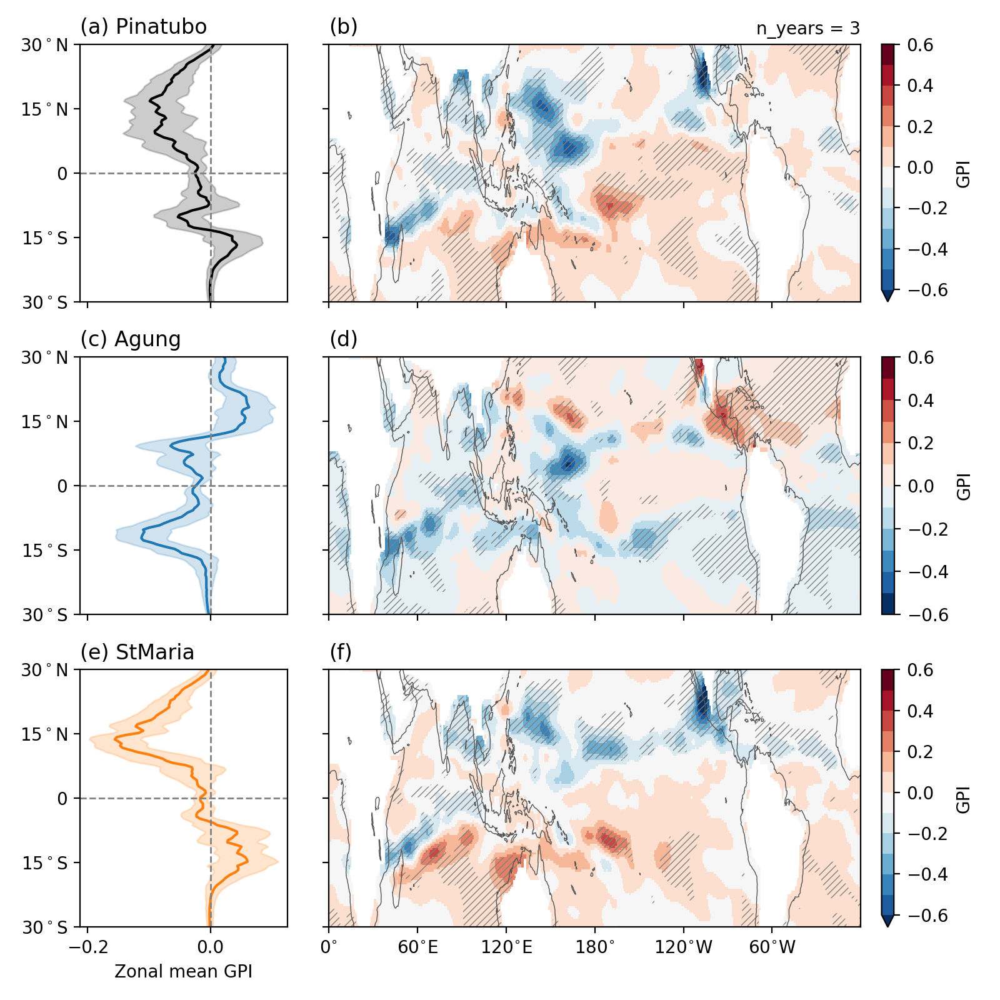

In [112]:
# fig  n_years = 3 lat/lon smoothed
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'GPI'
ctl_ens = das[f'{dataname}_ctl']
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = das[f'{dataname}_{volc}']
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-0.6,0.61,0.1) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean {dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_nyears{n_years}_smoothed.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


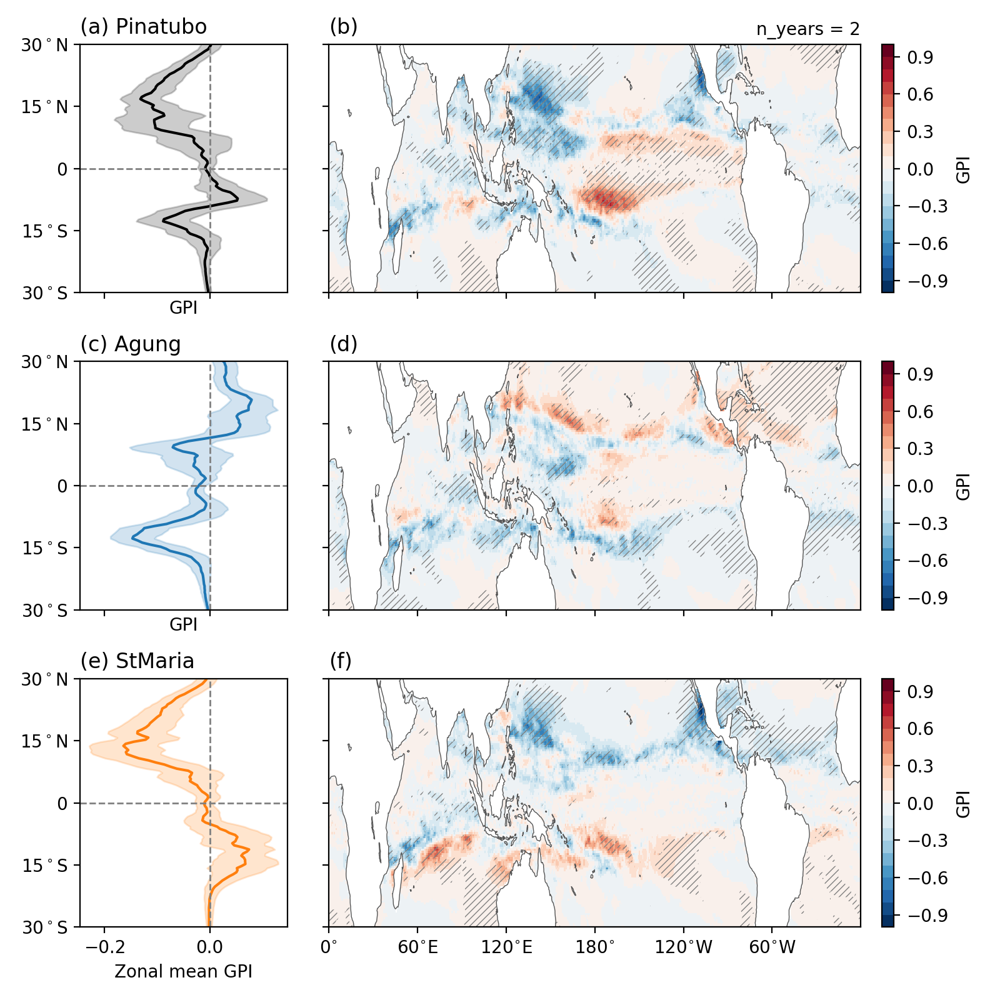

In [35]:
# fig n_years = 2
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'GPI'
ctl_ens = das[f'{dataname}_ctl']
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = das[f'{dataname}_{volc}']
n_years = 2
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-1,1.01,0.1) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean {dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


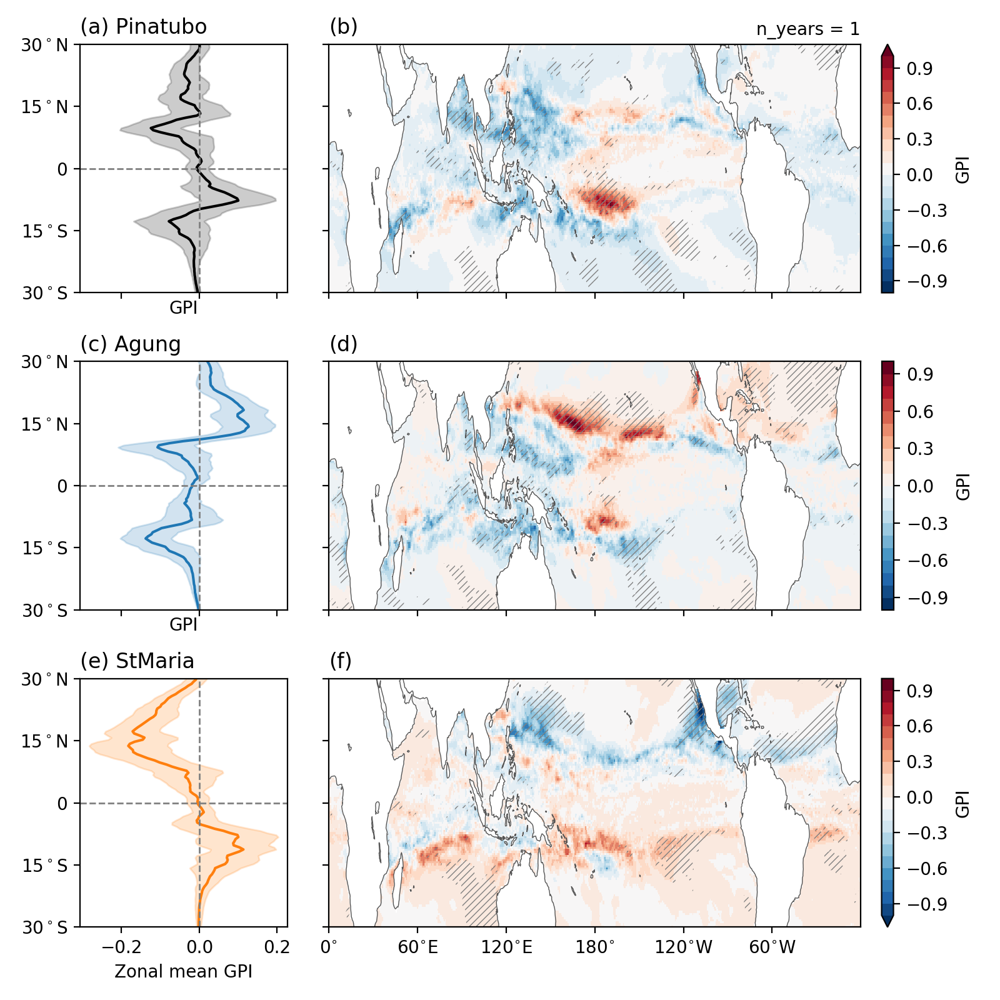

In [38]:
# fig n_years = 1
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'GPI'
ctl_ens = das[f'{dataname}_ctl']
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = das[f'{dataname}_{volc}']
n_years = 1
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-1,1.01,0.1) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean {dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


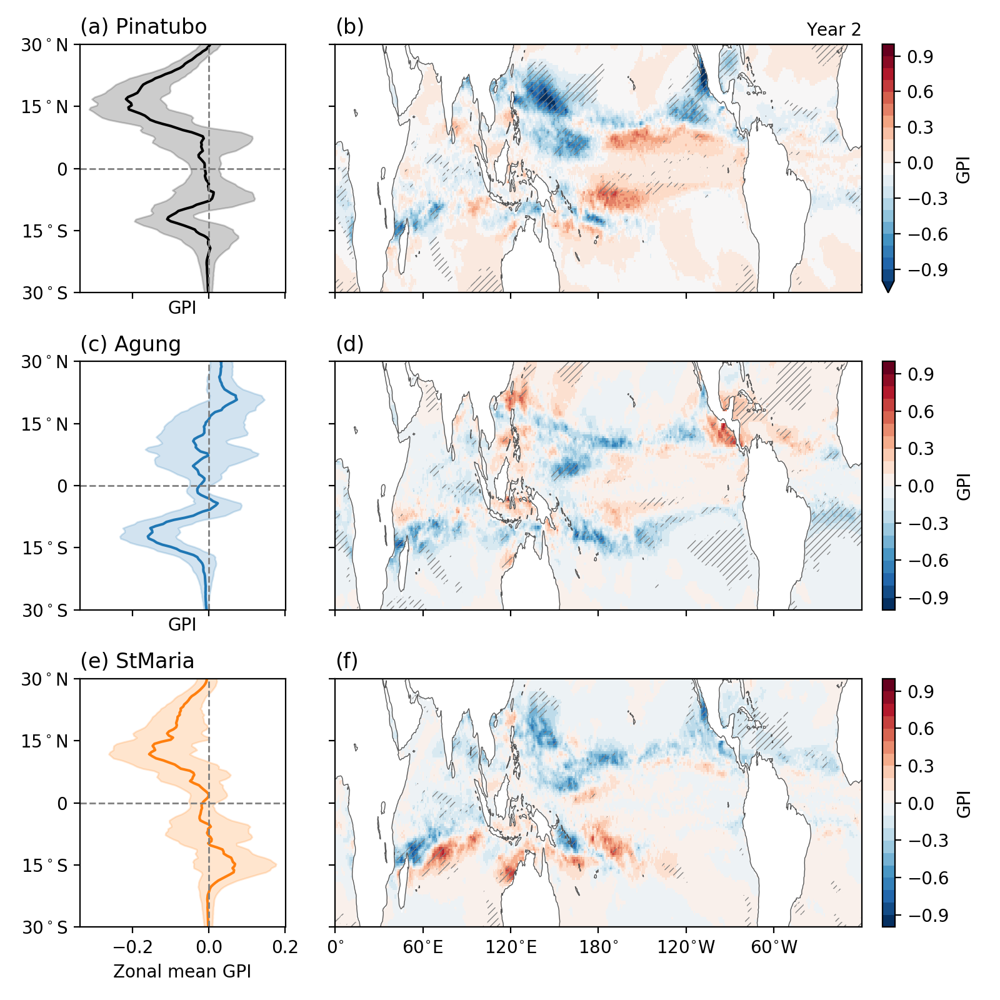

In [43]:
# fig iyear = 2
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'GPI'
ctl_ens = das[f'{dataname}_ctl']
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = das[f'{dataname}_{volc}']
iyear = 2
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-1,1.01,0.1) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1 + (iyear-1)*12, mon_start-1 + iyear*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1 + (iyear-1)*12, mon_start-1 + iyear*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1 + (iyear-1)*12, mon_start-1 + iyear*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean {dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1 + (iyear-1)*12, mon_start-1 + iyear*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'Year {iyear}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1 + (iyear-1)*12, mon_start-1 + iyear*12)).mean('time')
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1 + (iyear-1)*12, mon_start-1 + iyear*12)).mean('time') 
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_iyear{iyear}.pdf'
plt.savefig(figname)

## GPI components

### data

In [52]:
# data
datanames = ['eta', 'H', 'Vpot', 'Vshear']
volcs = ['Pinatubo', 'Agung', 'StMaria']
years = [1991, 1963, 1902]
months = [6, 3, 10]
n_years = 3

for dataname in datanames:
    print()
    print(dataname)
    # volc
    ifiles = [f'data/{volc}_PI_ens_noleap.GPI.{dataname}.nc'
             for volc in volcs]
    for volc, ifile, yyyy, mm in zip(volcs, ifiles, years, months):
        key = f'{dataname}_{volc}'
        print(key, end='; ')
        da = xr.open_dataset(ifile)[dataname]
        das[key] = da.load()

    # ctl
    ifile = f'data/CTL1860_noleap_tigercpu_intelmpi_18_576PE.GPI.{dataname}.nc'
    key = f'{dataname}_ctl'
    print(key, end='; ')
    da = xr.open_dataset(ifile)[dataname]
    das[key] = da.load()



eta
eta_Pinatubo; eta_Agung; eta_StMaria; eta_ctl; 
H
H_Pinatubo; H_Agung; H_StMaria; H_ctl; 
Vpot
Vpot_Pinatubo; Vpot_Agung; Vpot_StMaria; Vpot_ctl; 
Vshear
Vshear_Pinatubo; Vshear_Agung; Vshear_StMaria; Vshear_ctl; 

### fig GPI_$\eta$

<IPython.core.display.Javascript object>


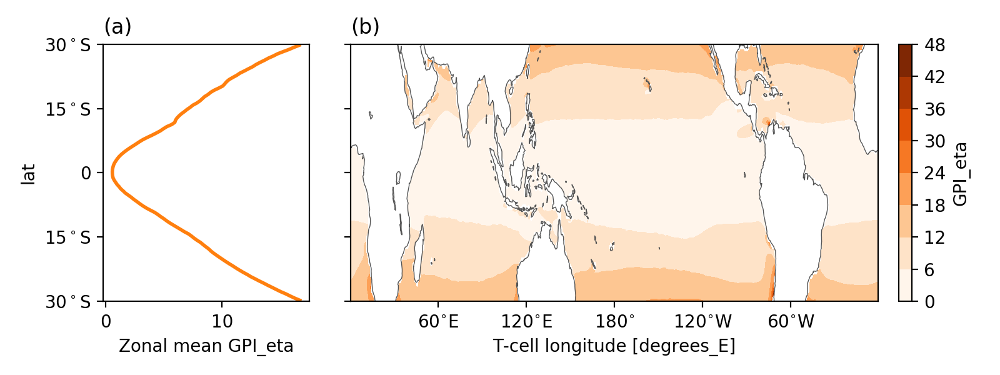

In [119]:
# GPI_eta in control run
fig, axes = plt.subplots(1, 2, figsize=(8,3), sharey=True)
dataname = 'eta'
lat_slice = slice(-30,30)
ctl_ens = das[f'{dataname}_ctl'].sel(lat=lat_slice)
da = ( np.abs(ctl_ens)*1e5 ) ** (3/2)
levels = 10#2**np.arange(-2, 7).astype('float')
cbar_kws = {}#dict(ticks=[0.25, 1, 4, 16, 64], format='%.2g')

ax = axes[0]
da.sel(time='0001').mean(['time', 'en', 'lon']).plot(ax=ax, y='lat', color='C1')
plt.autoscale()
ax.set_ylabel('lat')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_title('(a)', loc='left')

ax = axes[1]

da.sel(time='0001').mean(['time', 'en']).rename(f'GPI_{dataname}') \
    .plot.contourf(ax=ax, robust=False, levels=levels, cbar_kwargs=cbar_kws, cmap='Oranges')
mapplot(coastlines_width=1/2)
plt.ylabel('')
ax.set_yticks(range(-45, 46, 15))
ax.set_yticklabels([f'{-n}$^\circ$S' for n in range(-45,0,15)]
                  + ['0']
                  + [f'{n}$^\circ$S' for n in range(15, 46, 15)])
ax.set_title('(b)', loc='left')
ax.set_ylim(lat_slice.start, lat_slice.stop)


plt.tight_layout()
axscale(axes[0], right=-0.5)
axscale(axes[1], left=0.6)

plt.savefig(f'figs/fig_GPI_{dataname}_ctl.pdf')

<IPython.core.display.Javascript object>


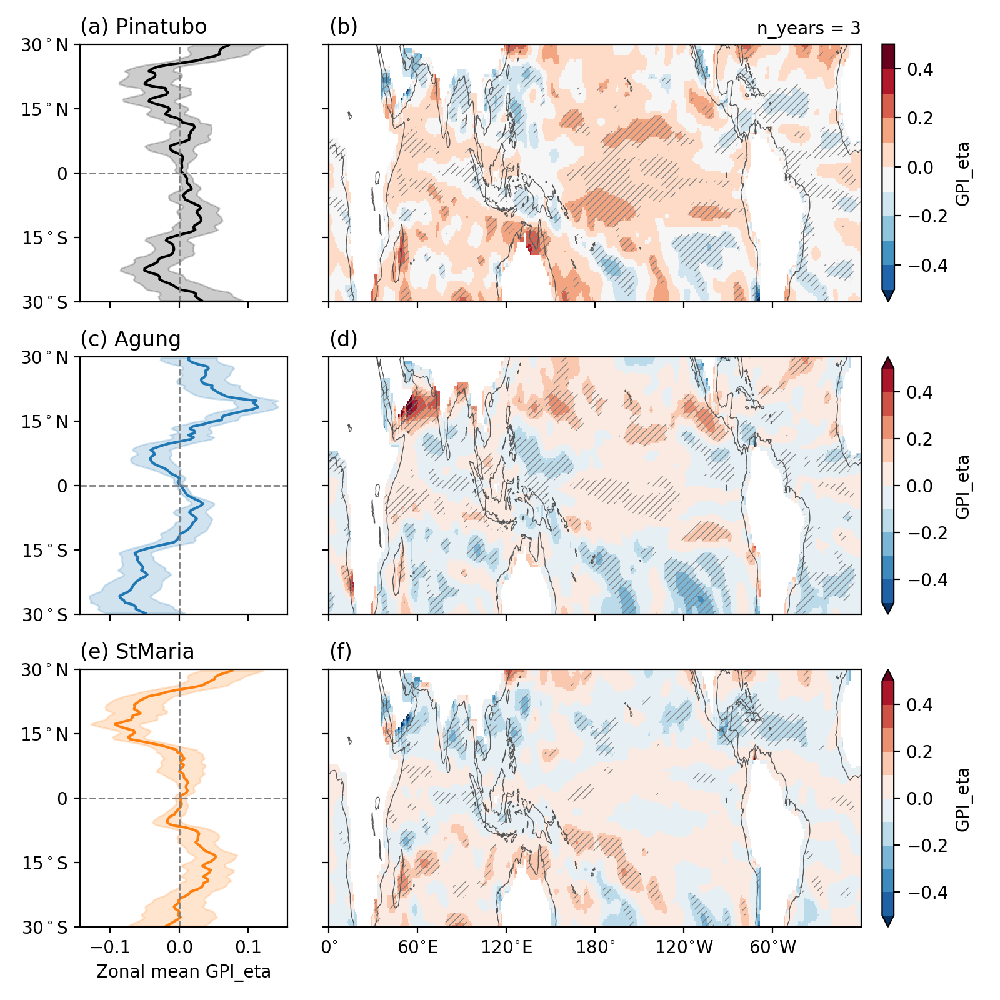

In [115]:
# fig GPI_eta  n_years = 3, smoothed
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'eta'
lat_slice = slice(-30,30)
ctl_ens = ( np.abs( das[f'{dataname}_ctl'].sel(lat=lat_slice) ) * 1e5 )** (3/2)
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( np.abs( das[f'{dataname}_{volc}'].sel(lat=lat_slice) ) * 1e5 )**(3/2)
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-0.5,0.51,0.1) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


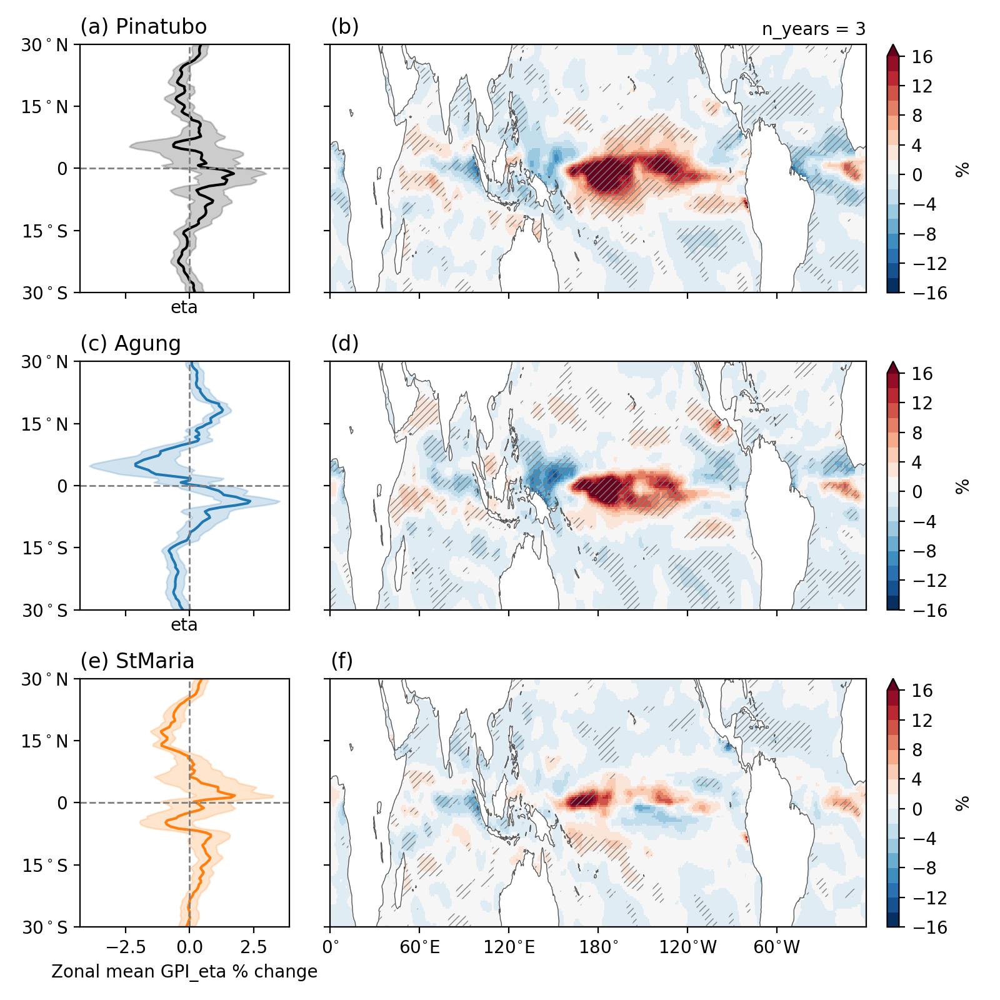

In [105]:
# fig GPI_eta  n_years = 3 smoothed percentage
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'eta'
lat_slice = slice(-30,30)
ctl_ens = ( np.abs( das[f'{dataname}_ctl'].sel(lat=lat_slice) ) * 1e5 )** (3/2)
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( np.abs( das[f'{dataname}_{volc}'].sel(lat=lat_slice) ) * 1e5 )**(3/2)
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-16,17,2) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname} % change')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}_smoothedPercent.pdf'
plt.savefig(figname)

### fig GPI_H

<IPython.core.display.Javascript object>


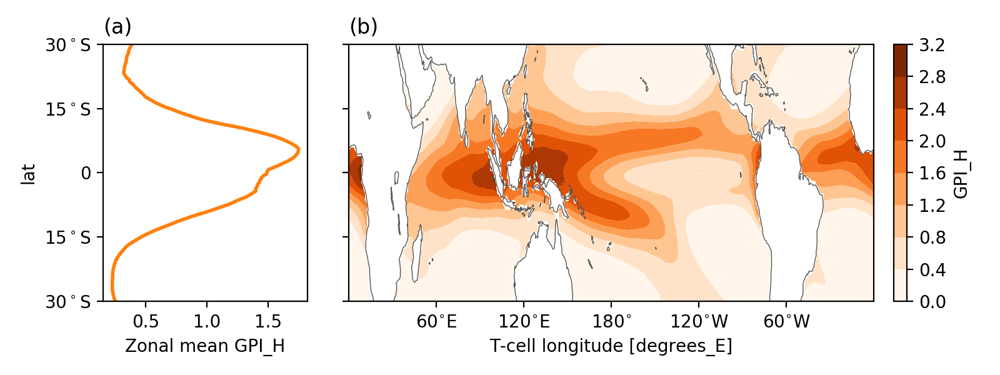

In [120]:
# GPI_H in control run
fig, axes = plt.subplots(1, 2, figsize=(8,3), sharey=True)
dataname = 'H'
lat_slice = slice(-30,30)
ctl_ens = das[f'{dataname}_ctl'].sel(lat=lat_slice)
da = ( ctl_ens.sel(lat=lat_slice)/50 ) ** 3
levels = 10#2**np.arange(-2, 7).astype('float')
cbar_kws = {}#dict(ticks=[0.25, 1, 4, 16, 64], format='%.2g')

ax = axes[0]
da.sel(time='0001').mean(['time', 'en', 'lon']).plot(ax=ax, y='lat', color='C1')
plt.autoscale()
ax.set_ylabel('lat')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_title('(a)', loc='left')

ax = axes[1]

da.sel(time='0001').mean(['time', 'en']).rename(f'GPI_{dataname}') \
    .plot.contourf(ax=ax, robust=False, levels=levels, cbar_kwargs=cbar_kws, cmap='Oranges')
mapplot(coastlines_width=1/2)
plt.ylim(-50, 50)
plt.ylabel('')
ax.set_yticks(range(-45, 46, 15))
ax.set_yticklabels([f'{-n}$^\circ$S' for n in range(-45,0,15)]
                  + ['0']
                  + [f'{n}$^\circ$S' for n in range(15, 46, 15)])
ax.set_title('(b)', loc='left')
ax.set_ylim(lat_slice.start, lat_slice.stop)


plt.tight_layout()
axscale(axes[0], right=-0.5)
axscale(axes[1], left=0.6)

plt.savefig(f'figs/fig_GPI_{dataname}_ctl.pdf')

<IPython.core.display.Javascript object>


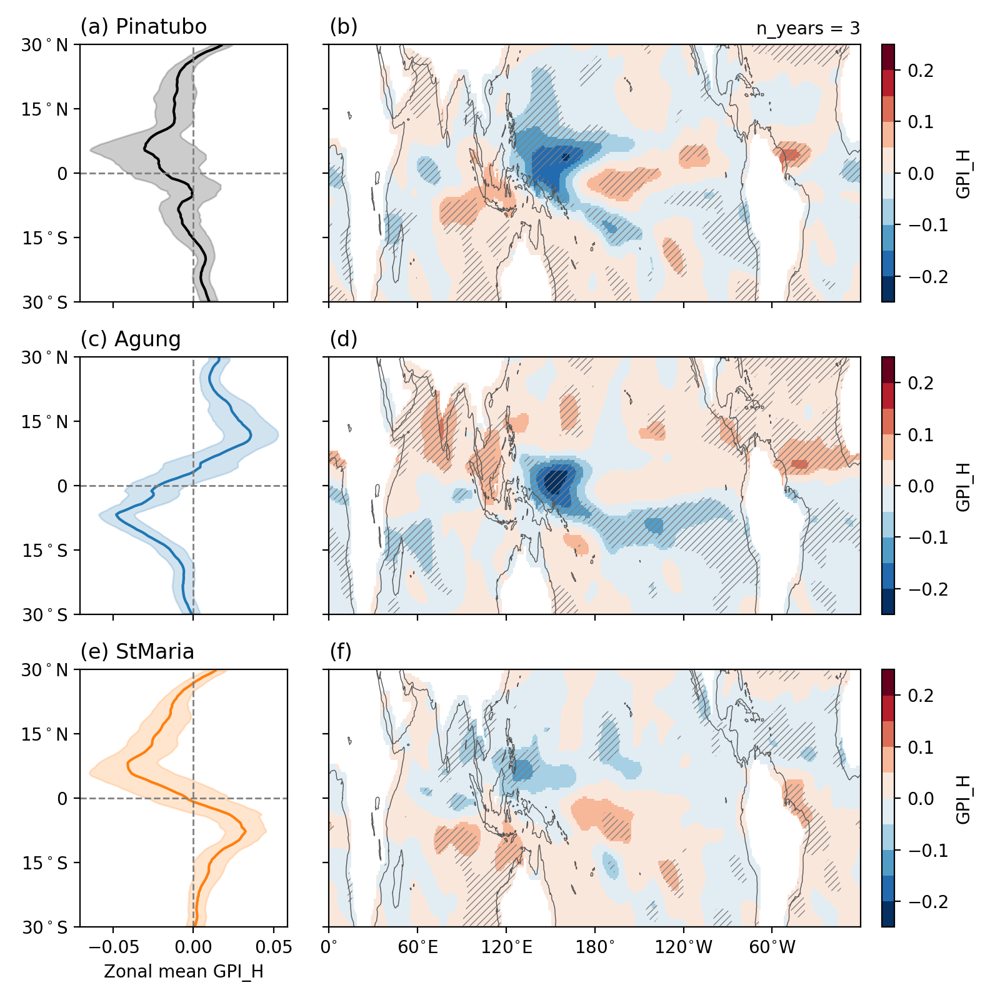

In [116]:
# fig GPI_H  n_years = 3, smoothed
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'H'
lat_slice = slice(-30,30)
ctl_ens = ( das[f'{dataname}_ctl'].sel(lat=lat_slice) /50 )** 3
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( das[f'{dataname}_{volc}'].sel(lat=lat_slice) / 50 )**3
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-0.25,0.26,0.05) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(lat_slice.start, lat_slice.stop)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


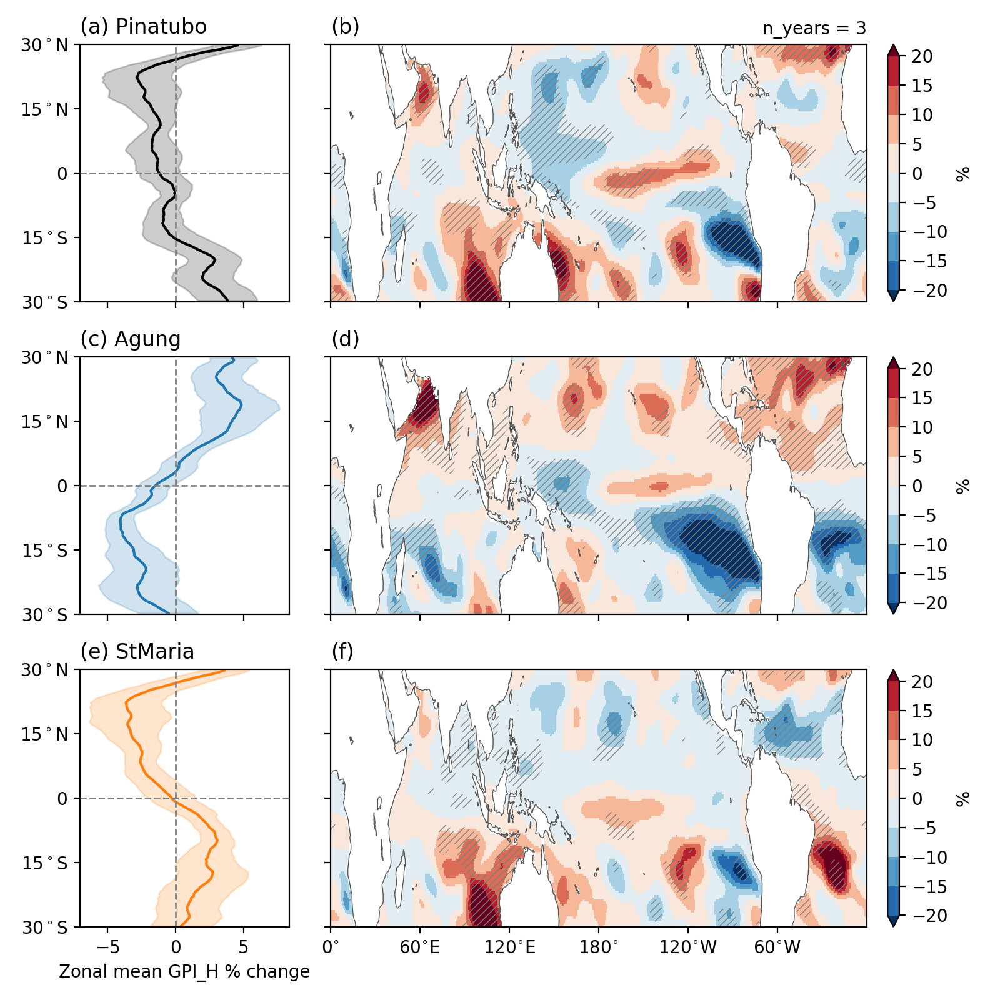

In [102]:
# fig GPI_H  n_years = 3 smoothed percentage
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'H'
lat_slice = slice(-30,30)
ctl_ens = ( das[f'{dataname}_ctl'].sel(lat=lat_slice) /50 )** 3
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( das[f'{dataname}_{volc}'].sel(lat=lat_slice) / 50 )**3
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-20,21,5) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname} % change')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}_smoothedPercent.pdf'
plt.savefig(figname)

### fig GPI_Vpot

<IPython.core.display.Javascript object>


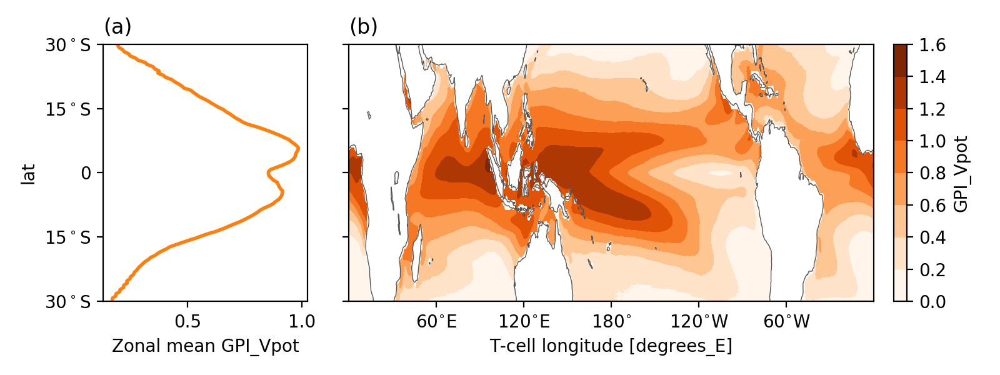

In [121]:
# GPI_Vpot in control run
fig, axes = plt.subplots(1, 2, figsize=(8,3), sharey=True)
dataname = 'Vpot'
lat_slice = slice(-30,30)
ctl_ens = das[f'{dataname}_ctl'].sel(lat=lat_slice)
da = ( ctl_ens/70 ) ** 3
levels = 10#2**np.arange(-2, 7).astype('float')
cbar_kws = {}#dict(ticks=[0.25, 1, 4, 16, 64], format='%.2g')

ax = axes[0]
da.sel(time='0001').mean(['time', 'en', 'lon']).plot(ax=ax, y='lat', color='C1')
plt.autoscale()
ax.set_ylabel('lat')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_title('(a)', loc='left')

ax = axes[1]

da.sel(time='0001').mean(['time', 'en']).rename(f'GPI_{dataname}') \
    .plot.contourf(ax=ax, robust=False, levels=levels, cbar_kwargs=cbar_kws, cmap='Oranges')
mapplot(coastlines_width=1/2)
plt.ylabel('')
ax.set_yticks(range(-45, 46, 15))
ax.set_yticklabels([f'{-n}$^\circ$S' for n in range(-45,0,15)]
                  + ['0']
                  + [f'{n}$^\circ$S' for n in range(15, 46, 15)])
ax.set_title('(b)', loc='left')
ax.set_ylim(lat_slice.start, lat_slice.stop)


plt.tight_layout()
axscale(axes[0], right=-0.5)
axscale(axes[1], left=0.6)

plt.savefig(f'figs/fig_GPI_{dataname}_ctl.pdf')

<IPython.core.display.Javascript object>


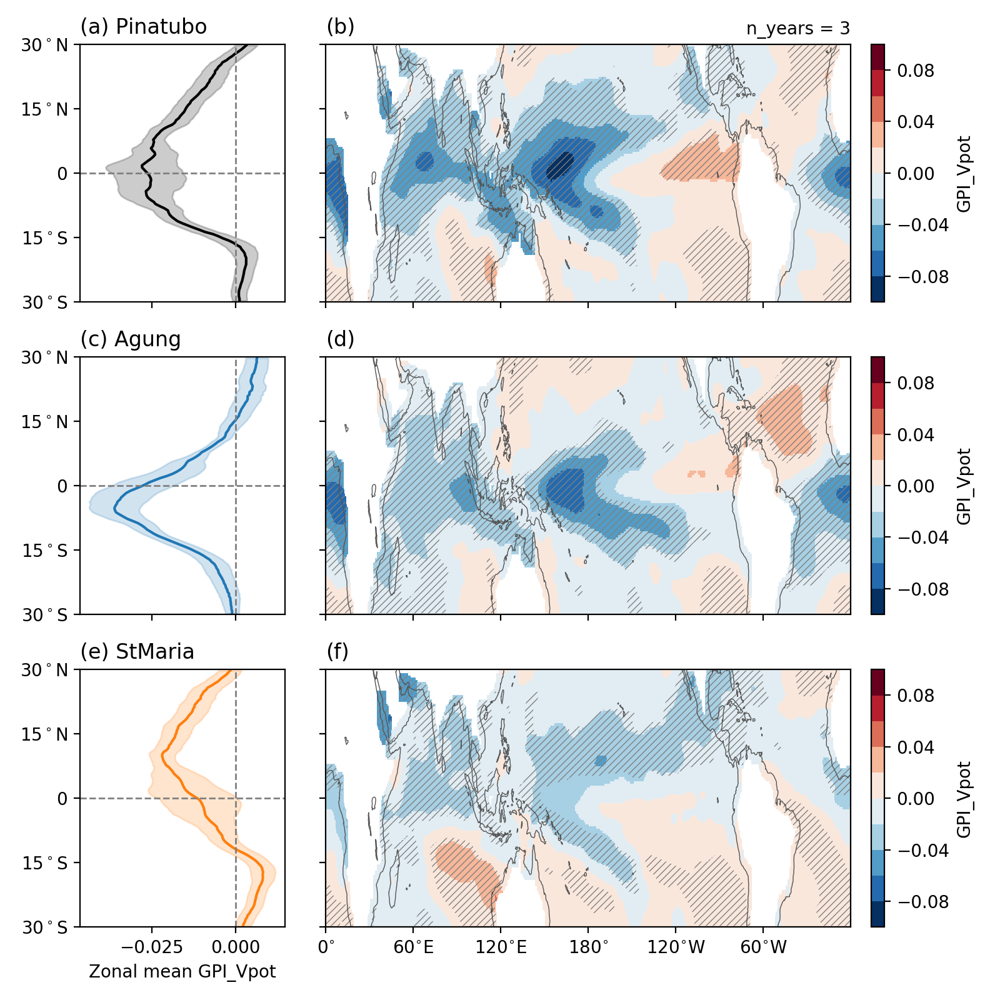

In [117]:
# fig GPI_Vpot  n_years = 3, smoothed
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'Vpot'
lat_slice = slice(-30,30)
ctl_ens = ( das[f'{dataname}_ctl'].sel(lat=lat_slice) /70 )** 3
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( das[f'{dataname}_{volc}'].sel(lat=lat_slice) / 70 )**3
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-0.1,0.105,0.02) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


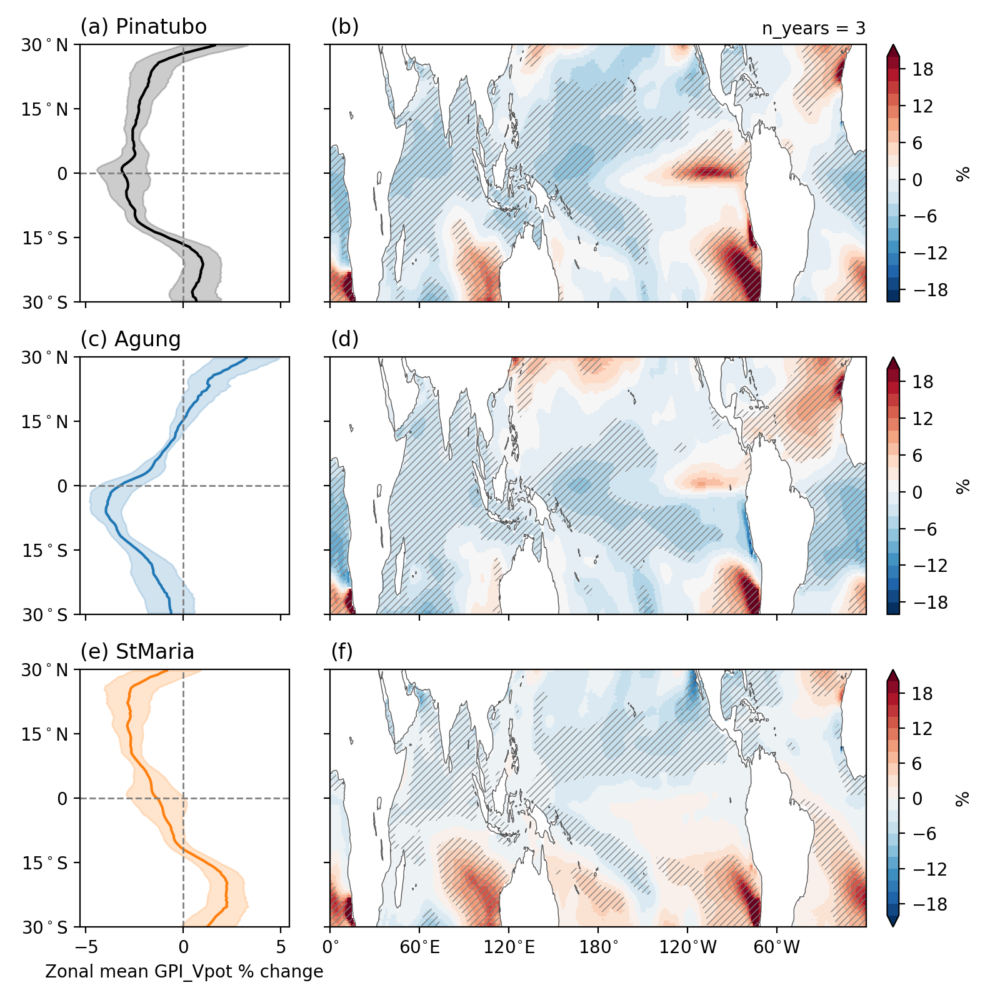

In [100]:
# fig GPI_Vpot  n_years = 3 smoothed percentage
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'Vpot'
lat_slice = slice(-30,30)
ctl_ens = ( das[f'{dataname}_ctl'].sel(lat=lat_slice) /70 )** 3
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( das[f'{dataname}_{volc}'].sel(lat=lat_slice) / 70 )**3
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-20,21,2) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname} % change')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}_smoothedPercent.pdf'
plt.savefig(figname)

### fig GPI_Vshear

<IPython.core.display.Javascript object>


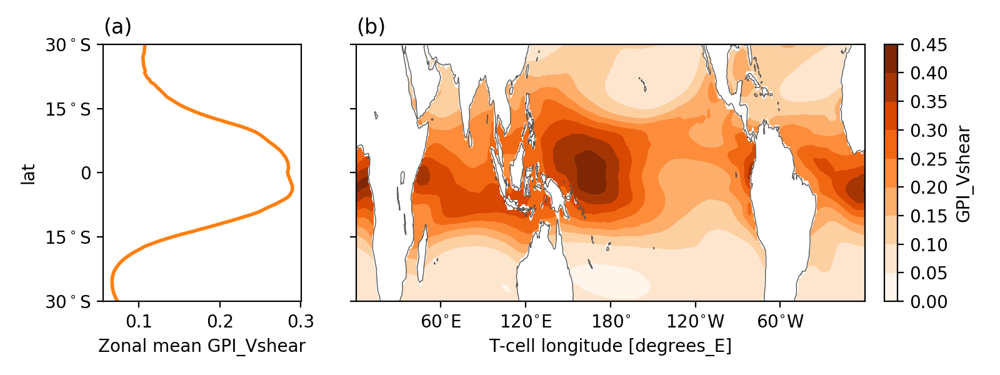

In [122]:
# GPI_Vshear in control run
fig, axes = plt.subplots(1, 2, figsize=(8,3), sharey=True)
dataname = 'Vshear'
lat_slice = slice(-30,30)
ctl_ens = das[f'{dataname}_ctl'].sel(lat=lat_slice)
da = ( 1 + 0.1*ctl_ens ) ** (-2)
levels = 10#2**np.arange(-2, 7).astype('float')
cbar_kws = {}#dict(ticks=[0.25, 1, 4, 16, 64], format='%.2g')

ax = axes[0]
da.sel(time='0001').mean(['time', 'en', 'lon']).plot(ax=ax, y='lat', color='C1')
plt.autoscale()
ax.set_ylabel('lat')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_title('(a)', loc='left')

ax = axes[1]

da.sel(time='0001').mean(['time', 'en']).rename(f'GPI_{dataname}') \
    .plot.contourf(ax=ax, robust=False, levels=levels, cbar_kwargs=cbar_kws, cmap='Oranges')
mapplot(coastlines_width=1/2)
plt.ylabel('')
ax.set_yticks(range(-45, 46, 15))
ax.set_yticklabels([f'{-n}$^\circ$S' for n in range(-45,0,15)]
                  + ['0']
                  + [f'{n}$^\circ$S' for n in range(15, 46, 15)])
ax.set_title('(b)', loc='left')
ax.set_ylim(lat_slice.start, lat_slice.stop)


plt.tight_layout()
axscale(axes[0], right=-0.5)
axscale(axes[1], left=0.6)

plt.savefig(f'figs/fig_GPI_{dataname}_ctl.pdf')

<IPython.core.display.Javascript object>


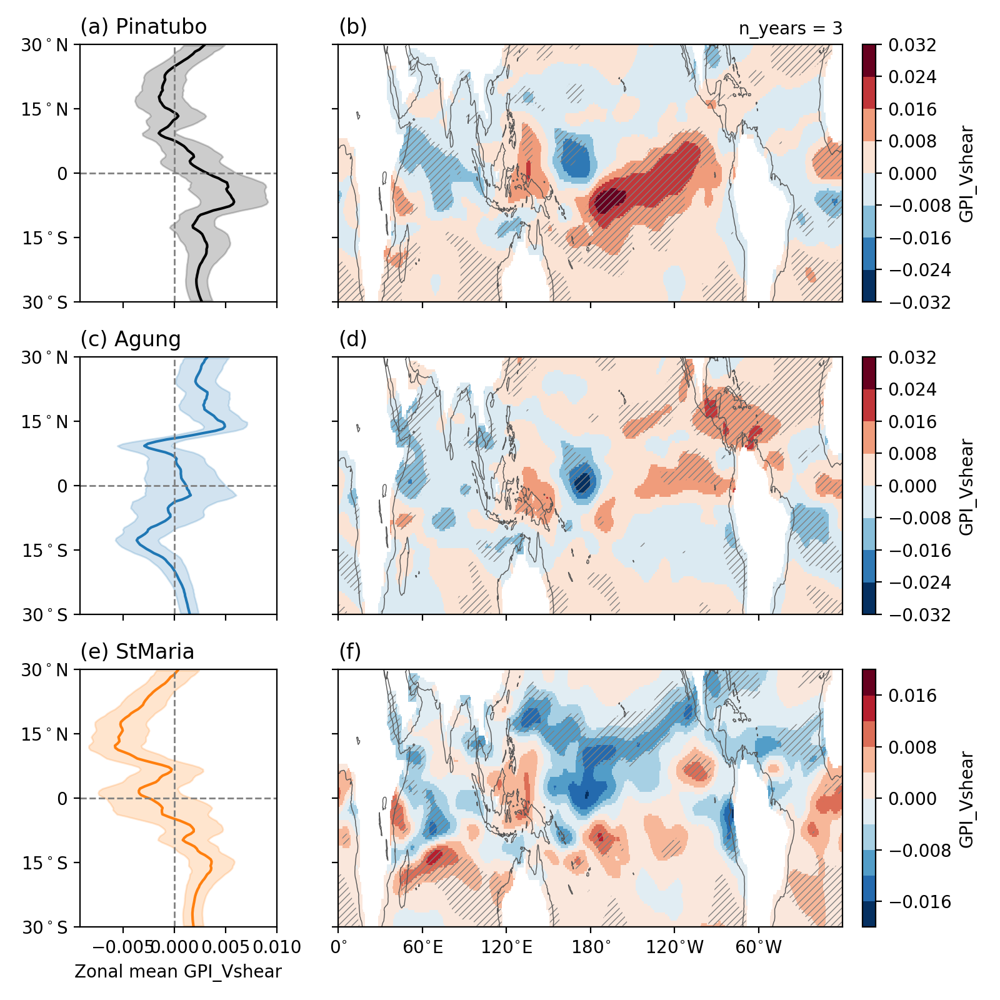

In [118]:
# fig GPI_Vshear  n_years = 3, smoothed
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'Vshear'
lat_slice = slice(-30,30)
ctl_ens = ( 1 + 0.1*das[f'{dataname}_ctl'].sel(lat=lat_slice) )** (-2)
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( 1 + 0.1*das[f'{dataname}_{volc}'].sel(lat=lat_slice) )**(-2)
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = 10#np.arange(-0.25,0.26,0.05) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ts = ts.mean('en')
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname}')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
da = da.mean('en')
sigmask = np.abs(da) > spread
da.rename(f'GPI_{dataname}').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(lat_slice.start, lat_slice.stop)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}.pdf'
plt.savefig(figname)

<IPython.core.display.Javascript object>


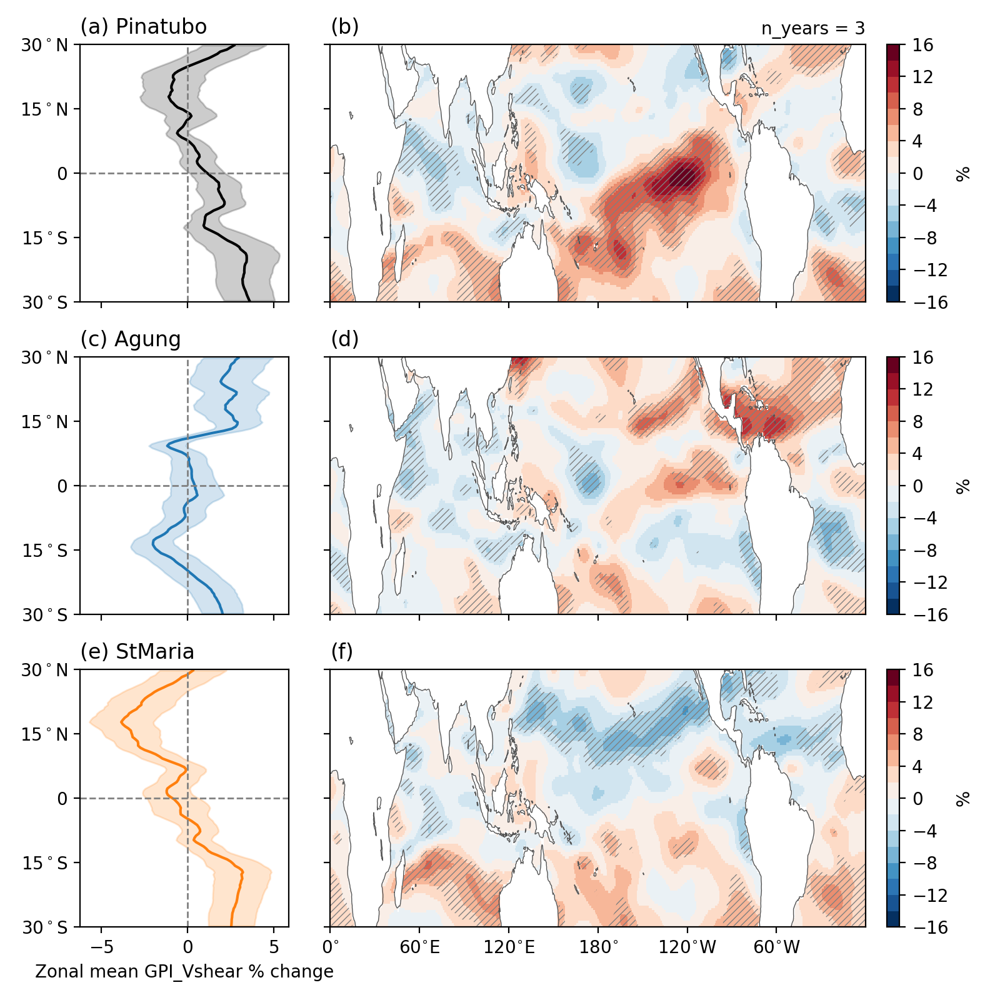

In [97]:
# fig GPI_Vshear  n_years = 3 smoothed percentage
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharey=True, sharex='col')
dataname = 'Vshear'
lat_slice = slice(-30,30)
ctl_ens = ( 1 + 0.1*das[f'{dataname}_ctl'].sel(lat=lat_slice) )** (-2)
dvs = dict()
for volc in ('Pinatubo', 'Agung', 'StMaria'):
    dvs[volc] = ( 1 + 0.1*das[f'{dataname}_{volc}'].sel(lat=lat_slice) )**(-2)
n_years = 3
# lv = 2**np.arange(-3, 4.1)
levels = np.arange(-16,17,2) # list(-lv[-1::-1]) + [0,] + list(lv)
coastline_width = .5
cbar_ticks = None#(-16, -4, -1, -0.25, 0, 0.25, 1, 4, 16)
cbar_format = None#'%.2g'
alpha=0.2
hatches = ['//////']

ax = axes[0, 0]
volc_name, tag, mon_start = 'Pinatubo', 'Pinatubo', 6
color = 'k'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='k')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color=color, alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(a) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')


ax = axes[1, 0]
# plt.sca(ax)
# ax.set_aspect(aspect)
# plt.sca(ax)
volc_name, tag, mon_start = 'Agung', 'Agung', 3
color = 'C0'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C0')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C0', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
ax.set_xlabel('')
# ax.grid('on')
ax.set_title(f'(c) {tag}', loc='left')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[2, 0]
volc_name, tag, mon_start = 'StMaria', 'StMaria', 10
color = 'C1'
ts = dvs[volc_name].pipe(lambda x: x-ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') \
    .mean('lon')
spread = p2t(0.05, df=ts.en.size-1) * ts.std('en') * ts.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en', 'lon'])
spread = spread/ctl*100
ts = ts.mean('en')/ctl*100
ts.plot(ax=ax, y='lat', label=tag, lw=1.5, color='C1')
ax.fill_betweenx(y=ts.lat, x1=ts-spread, x2=ts+spread, color='C1', alpha=alpha)
ax.autoscale()
ax.set_ylim(-30, 30)
ax.set_ylabel('')
# ax.grid('on')
ax.set_title(f'(e) {tag}', loc='left')
ax.set_xlabel(f'Zonal mean GPI_{dataname} % change')
ax.set_yticks(range(-45,46,15))
ax.axhline(0, color='gray', lw=1, ls='--')
ax.axvline(0, color='gray', lw=1, ls='--')

ax = axes[0, 1]
volc_name, mon_start = 'Pinatubo', 6
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(b)', loc='left')
# expand_ax(ax)
ax.text(1, 1.02, f'n_years = {n_years}', 
        transform=ax.transAxes, ha='right', va='bottom')

ax = axes[1, 1]
volc_name, mon_start = 'Agung', 3
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time')
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
plt.title('(d)', loc='left')
# expand_ax(ax)



ax = axes[2, 1]
plt.sca(ax)
volc_name, mon_start = 'StMaria', 10
da = dvs[volc_name].pipe(lambda x: x - ctl_ens.assign_coords(time=x.time)) \
    .isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean('time') 
da = da.rolling(lon=9, center=True, min_periods=1).mean() \
    .rolling(lat=9, center=True, min_periods=1).mean()
spread = p2t(0.05, df=da.en.size-1) * da.std('en') * da.en.size**(-1/2)
ctl = ctl_ens.isel(time=slice(mon_start-1, mon_start-1 + n_years*12)).mean(['time', 'en'])
da = da.mean('en')
sigmask = np.abs(da) > spread
spread = spread/ctl*100
da = da/ctl*100
da.rename('%').plot(ax=ax, levels=levels, cbar_kwargs={'ticks': cbar_ticks, 'format': cbar_format}, rasterized=True)
da.where(sigmask).pipe(lambda x: x*0).plot.contourf(ax=ax, colors='none', hatches=hatches, 
                                              add_colorbar=False)
mapplot(ax=ax, lon=da.lon, lat=(-50, 50), linewidth=coastline_width)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_yticks(np.arange(-45,46,15))
ax.set_yticklabels(['45$^\circ$S', '30$^\circ$S', '15$^\circ$S', '0', '15$^\circ$N', '30$^\circ$N', '45$^\circ$N'])
plt.title('(f)', loc='left')
# yticks2lat(np.arange(-45,46,15))
# expand_ax(ax)


ax.set_ylim(-30, 30)
plt.tight_layout()
for ax in axes[:, 0]:
    axscale(ax, right=-0.5)
for ax in axes[:, 1]:
    axscale(ax, left=0.6)

figname = f'figs/fig_GPI_{dataname}_nyears{n_years}_smoothedPercent.pdf'
plt.savefig(figname)

In [39]:
%%html
<script src="https://cdn.rawgit.com/parente/4c3e6936d0d7a46fd071/raw/65b816fb9bdd3c28b4ddf3af602bfd6015486383/code_toggle.js">
</script>